<a href="https://colab.research.google.com/github/yadavpa1/CS760-Machine-Learning/blob/main/gan_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd drive/MyDrive/CS760_HW6_GANs

/content/drive/MyDrive/CS760_HW6_GANs


In [3]:
!ls

input  outputs	outputs2  outputs3


In [4]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [5]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
device

device(type='cuda')

# Prepare training dataset

In [7]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

# Generator

In [8]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [10]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [117]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [12]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [13]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [120]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)

# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

In [15]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

In [16]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [17]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

# Q. Write training loop

118it [00:14,  7.89it/s]                         


Epoch 1 of 100
Generator loss: 1.41038969, Discriminator loss: 0.99410363


118it [00:14,  7.96it/s]                         


Epoch 2 of 100
Generator loss: 1.51638150, Discriminator loss: 1.14112248


118it [00:15,  7.73it/s]                         


Epoch 3 of 100
Generator loss: 3.73055601, Discriminator loss: 0.88414871


118it [00:16,  7.11it/s]                         


Epoch 4 of 100
Generator loss: 1.23736176, Discriminator loss: 1.33724793


118it [00:15,  7.58it/s]                         


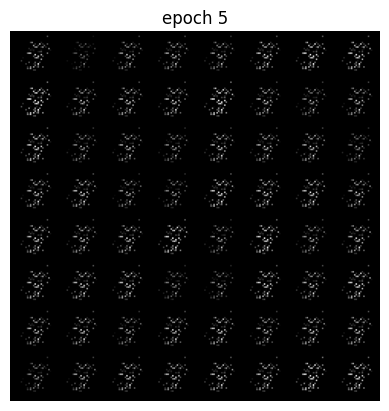

Epoch 5 of 100
Generator loss: 1.12725536, Discriminator loss: 1.15763975


118it [00:15,  7.85it/s]                         


Epoch 6 of 100
Generator loss: 2.68964247, Discriminator loss: 1.07153138


118it [00:15,  7.71it/s]                         


Epoch 7 of 100
Generator loss: 3.44473817, Discriminator loss: 1.06671804


118it [00:15,  7.58it/s]                         


Epoch 8 of 100
Generator loss: 1.44797280, Discriminator loss: 1.30202289


118it [00:15,  7.55it/s]                         


Epoch 9 of 100
Generator loss: 1.16694768, Discriminator loss: 1.22669669


118it [00:15,  7.63it/s]                         


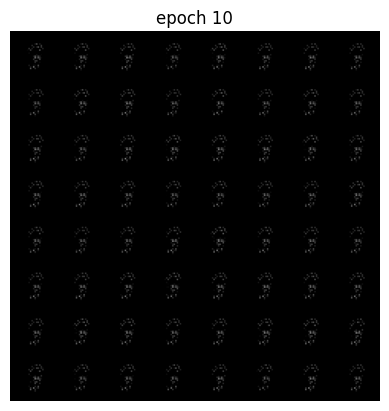

Epoch 10 of 100
Generator loss: 0.72359820, Discriminator loss: 1.30135753


118it [00:15,  7.53it/s]                         


Epoch 11 of 100
Generator loss: 1.22668749, Discriminator loss: 1.03641501


118it [00:15,  7.52it/s]                         


Epoch 12 of 100
Generator loss: 1.53482944, Discriminator loss: 1.11092369


118it [00:15,  7.71it/s]                         


Epoch 13 of 100
Generator loss: 2.41294687, Discriminator loss: 1.37294382


118it [00:15,  7.73it/s]                         


Epoch 14 of 100
Generator loss: 1.52672983, Discriminator loss: 1.12321326


118it [00:15,  7.57it/s]                         


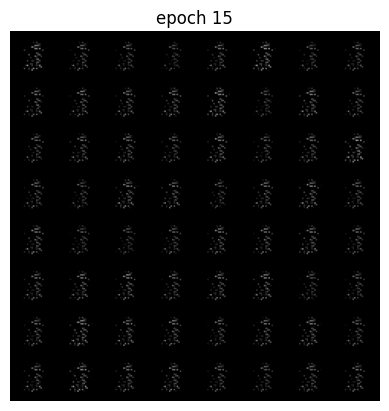

Epoch 15 of 100
Generator loss: 1.12817648, Discriminator loss: 1.29100121


118it [00:15,  7.54it/s]                         


Epoch 16 of 100
Generator loss: 1.19985895, Discriminator loss: 1.11198213


118it [00:15,  7.59it/s]                         


Epoch 17 of 100
Generator loss: 1.13200269, Discriminator loss: 1.22109727


118it [00:15,  7.53it/s]                         


Epoch 18 of 100
Generator loss: 2.03414819, Discriminator loss: 0.83777899


118it [00:15,  7.60it/s]                         


Epoch 19 of 100
Generator loss: 2.61784688, Discriminator loss: 0.85451310


118it [00:15,  7.66it/s]                         


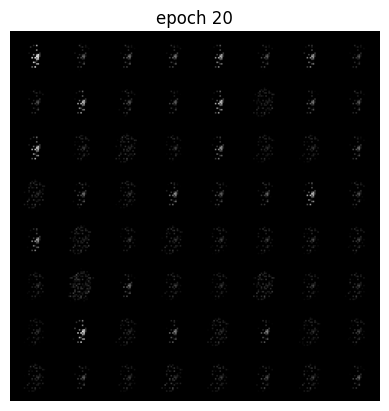

Epoch 20 of 100
Generator loss: 1.59907032, Discriminator loss: 1.10176214


118it [00:15,  7.83it/s]                         


Epoch 21 of 100
Generator loss: 2.01446567, Discriminator loss: 0.92240046


118it [00:15,  7.63it/s]                         


Epoch 22 of 100
Generator loss: 1.44010698, Discriminator loss: 0.90570559


118it [00:15,  7.48it/s]                         


Epoch 23 of 100
Generator loss: 1.68616714, Discriminator loss: 0.86108799


118it [00:15,  7.57it/s]                         


Epoch 24 of 100
Generator loss: 2.02570269, Discriminator loss: 0.69349821


118it [00:15,  7.69it/s]                         


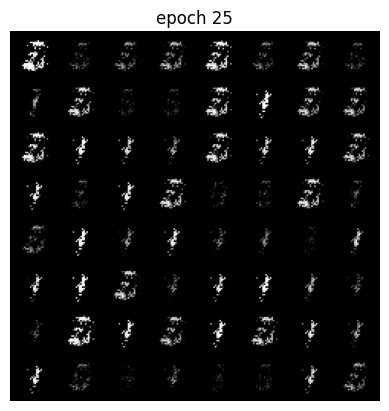

Epoch 25 of 100
Generator loss: 2.38487774, Discriminator loss: 0.81448639


118it [00:15,  7.61it/s]                         


Epoch 26 of 100
Generator loss: 2.08916744, Discriminator loss: 0.72066440


118it [00:15,  7.65it/s]                         


Epoch 27 of 100
Generator loss: 2.44095998, Discriminator loss: 0.66348604


118it [00:15,  7.67it/s]                         


Epoch 28 of 100
Generator loss: 3.14647145, Discriminator loss: 0.40590401


118it [00:15,  7.49it/s]                         


Epoch 29 of 100
Generator loss: 3.28616657, Discriminator loss: 0.51372445


118it [00:15,  7.53it/s]                         


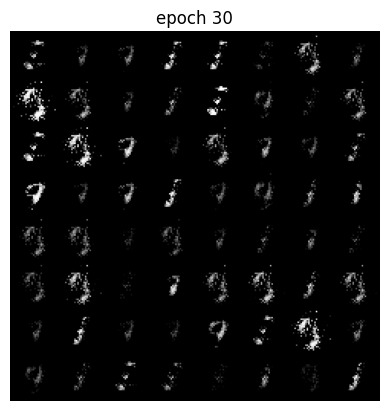

Epoch 30 of 100
Generator loss: 2.30719145, Discriminator loss: 0.71756129


118it [00:16,  7.24it/s]                         


Epoch 31 of 100
Generator loss: 2.43941542, Discriminator loss: 0.65763179


118it [00:15,  7.42it/s]                         


Epoch 32 of 100
Generator loss: 2.77338088, Discriminator loss: 0.49607128


118it [00:15,  7.50it/s]                         


Epoch 33 of 100
Generator loss: 2.78031043, Discriminator loss: 0.66503274


118it [00:15,  7.47it/s]                         


Epoch 34 of 100
Generator loss: 2.45967706, Discriminator loss: 0.57404199


118it [00:15,  7.50it/s]                         


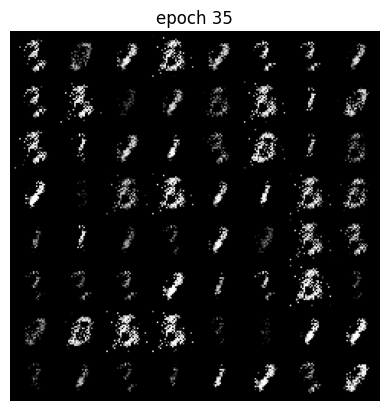

Epoch 35 of 100
Generator loss: 2.65385418, Discriminator loss: 0.61472380


118it [00:15,  7.49it/s]                         


Epoch 36 of 100
Generator loss: 2.76149740, Discriminator loss: 0.57601115


118it [00:15,  7.46it/s]                         


Epoch 37 of 100
Generator loss: 2.44526576, Discriminator loss: 0.63888996


118it [00:15,  7.46it/s]                         


Epoch 38 of 100
Generator loss: 2.45447214, Discriminator loss: 0.58760898


118it [00:15,  7.44it/s]                         


Epoch 39 of 100
Generator loss: 2.61497547, Discriminator loss: 0.56466357


118it [00:15,  7.52it/s]                         


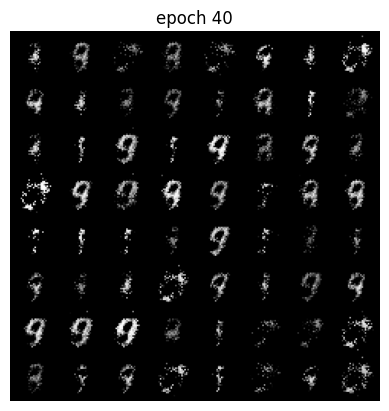

Epoch 40 of 100
Generator loss: 2.58210742, Discriminator loss: 0.56931171


118it [00:15,  7.40it/s]                         


Epoch 41 of 100
Generator loss: 3.03190879, Discriminator loss: 0.47354404


118it [00:15,  7.41it/s]                         


Epoch 42 of 100
Generator loss: 3.00592712, Discriminator loss: 0.56615973


118it [00:15,  7.41it/s]                         


Epoch 43 of 100
Generator loss: 2.96376861, Discriminator loss: 0.44104540


118it [00:15,  7.43it/s]                         


Epoch 44 of 100
Generator loss: 3.04707831, Discriminator loss: 0.49206459


118it [00:16,  7.36it/s]                         


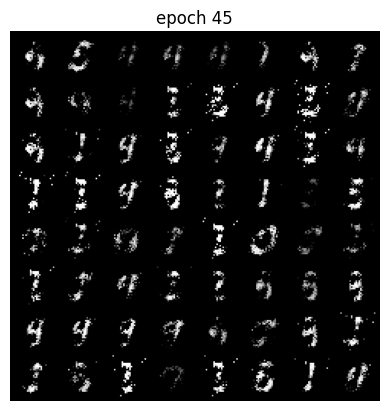

Epoch 45 of 100
Generator loss: 3.01664297, Discriminator loss: 0.50923492


118it [00:15,  7.41it/s]                         


Epoch 46 of 100
Generator loss: 3.04390197, Discriminator loss: 0.46476463


118it [00:15,  7.46it/s]                         


Epoch 47 of 100
Generator loss: 3.16002952, Discriminator loss: 0.49804907


118it [00:15,  7.51it/s]                         


Epoch 48 of 100
Generator loss: 2.86643345, Discriminator loss: 0.51838616


118it [00:15,  7.43it/s]                         


Epoch 49 of 100
Generator loss: 2.77788197, Discriminator loss: 0.52208534


118it [00:15,  7.42it/s]                         


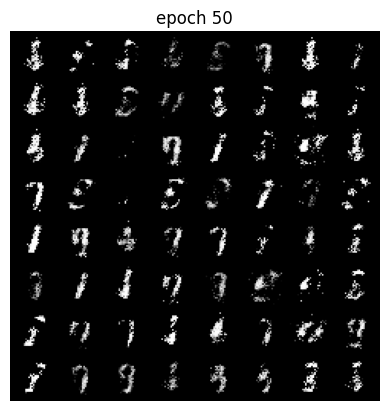

Epoch 50 of 100
Generator loss: 2.75193027, Discriminator loss: 0.50597487


118it [00:15,  7.58it/s]                         


Epoch 51 of 100
Generator loss: 2.94702710, Discriminator loss: 0.52806753


118it [00:15,  7.58it/s]                         


Epoch 52 of 100
Generator loss: 2.91371093, Discriminator loss: 0.48033538


118it [00:15,  7.41it/s]                         


Epoch 53 of 100
Generator loss: 2.81933389, Discriminator loss: 0.52595364


118it [00:15,  7.42it/s]                         


Epoch 54 of 100
Generator loss: 2.92468292, Discriminator loss: 0.49276635


118it [00:15,  7.53it/s]                         


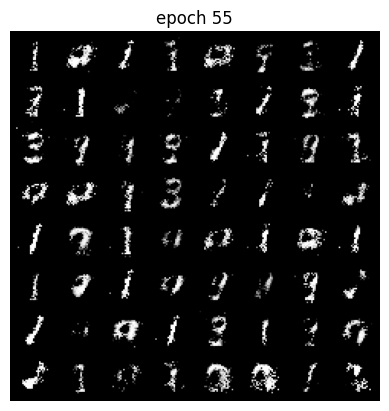

Epoch 55 of 100
Generator loss: 2.83419717, Discriminator loss: 0.55541695


118it [00:15,  7.48it/s]                         


Epoch 56 of 100
Generator loss: 2.58603119, Discriminator loss: 0.62062062


118it [00:16,  7.34it/s]                         


Epoch 57 of 100
Generator loss: 2.49121445, Discriminator loss: 0.59027084


118it [00:15,  7.46it/s]                         


Epoch 58 of 100
Generator loss: 2.67784166, Discriminator loss: 0.52749606


118it [00:15,  7.51it/s]                         


Epoch 59 of 100
Generator loss: 2.72710053, Discriminator loss: 0.53334009


118it [00:15,  7.41it/s]                         


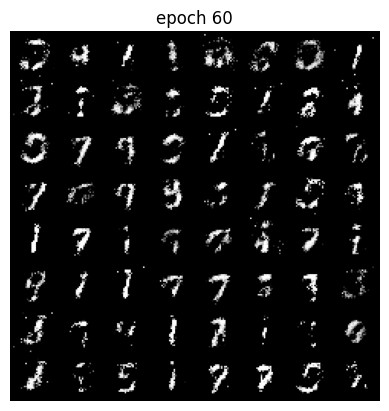

Epoch 60 of 100
Generator loss: 2.73661372, Discriminator loss: 0.54034669


118it [00:15,  7.39it/s]                         


Epoch 61 of 100
Generator loss: 2.75495569, Discriminator loss: 0.50257982


118it [00:15,  7.39it/s]                         


Epoch 62 of 100
Generator loss: 2.65464635, Discriminator loss: 0.53943287


118it [00:16,  7.37it/s]                         


Epoch 63 of 100
Generator loss: 2.76939738, Discriminator loss: 0.54975748


118it [00:15,  7.51it/s]                         


Epoch 64 of 100
Generator loss: 2.48019945, Discriminator loss: 0.61320368


118it [00:16,  7.34it/s]                         


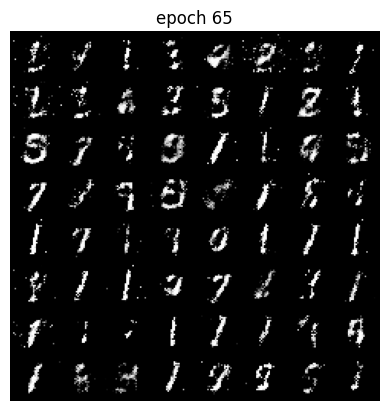

Epoch 65 of 100
Generator loss: 2.47609432, Discriminator loss: 0.59670666


118it [00:16,  7.34it/s]                         


Epoch 66 of 100
Generator loss: 2.60411524, Discriminator loss: 0.57042401


118it [00:15,  7.39it/s]                         


Epoch 67 of 100
Generator loss: 2.58969135, Discriminator loss: 0.58537161


118it [00:16,  7.31it/s]                         


Epoch 68 of 100
Generator loss: 2.61756059, Discriminator loss: 0.57925508


118it [00:16,  7.26it/s]                         


Epoch 69 of 100
Generator loss: 2.63435758, Discriminator loss: 0.55250016


118it [00:16,  7.23it/s]                         


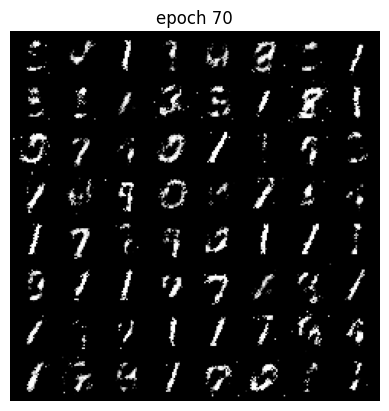

Epoch 70 of 100
Generator loss: 2.74931987, Discriminator loss: 0.52046374


118it [00:16,  7.28it/s]                         


Epoch 71 of 100
Generator loss: 2.61993133, Discriminator loss: 0.56272884


118it [00:16,  7.35it/s]                         


Epoch 72 of 100
Generator loss: 2.66353027, Discriminator loss: 0.56178348


118it [00:16,  7.21it/s]                         


Epoch 73 of 100
Generator loss: 2.59380207, Discriminator loss: 0.61680077


118it [00:15,  7.44it/s]                         


Epoch 74 of 100
Generator loss: 2.53574586, Discriminator loss: 0.60199256


118it [00:16,  7.29it/s]                         


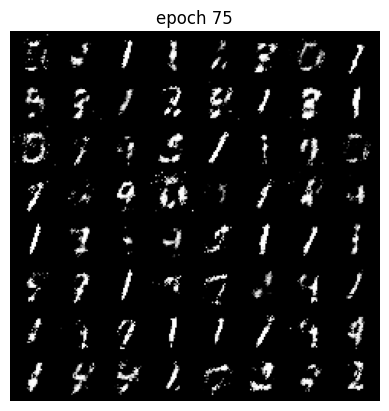

Epoch 75 of 100
Generator loss: 2.45229478, Discriminator loss: 0.61324393


118it [00:16,  7.36it/s]                         


Epoch 76 of 100
Generator loss: 2.31119680, Discriminator loss: 0.63417897


118it [00:16,  7.31it/s]                         


Epoch 77 of 100
Generator loss: 2.40084269, Discriminator loss: 0.62575098


118it [00:16,  7.25it/s]                         


Epoch 78 of 100
Generator loss: 2.36010457, Discriminator loss: 0.62659319


118it [00:20,  5.81it/s]                         


Epoch 79 of 100
Generator loss: 2.34670341, Discriminator loss: 0.66953787


118it [00:16,  7.07it/s]                         


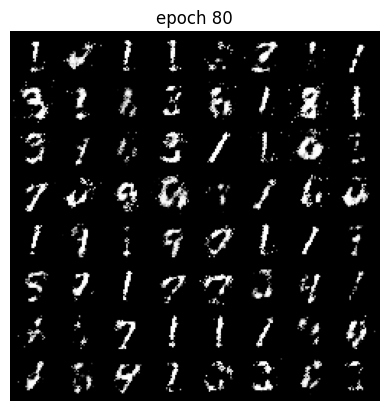

Epoch 80 of 100
Generator loss: 2.34795709, Discriminator loss: 0.66575630


118it [00:16,  7.25it/s]                         


Epoch 81 of 100
Generator loss: 2.22048368, Discriminator loss: 0.67656857


118it [00:16,  7.14it/s]                         


Epoch 82 of 100
Generator loss: 2.24397634, Discriminator loss: 0.66958113


118it [00:16,  7.12it/s]                         


Epoch 83 of 100
Generator loss: 2.22240249, Discriminator loss: 0.69210415


118it [00:16,  7.18it/s]                         


Epoch 84 of 100
Generator loss: 2.11556261, Discriminator loss: 0.71401008


118it [00:16,  7.23it/s]                         


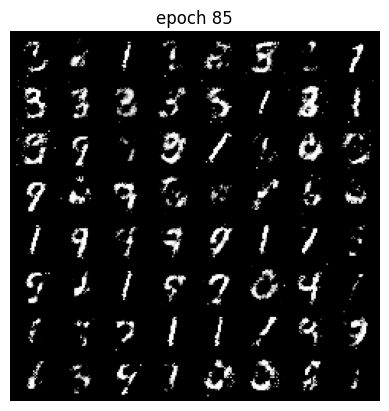

Epoch 85 of 100
Generator loss: 2.06894166, Discriminator loss: 0.73773424


118it [00:16,  7.18it/s]                         


Epoch 86 of 100
Generator loss: 2.06813766, Discriminator loss: 0.75165334


118it [00:17,  6.92it/s]                         


Epoch 87 of 100
Generator loss: 2.08219503, Discriminator loss: 0.73876943


118it [00:16,  7.08it/s]                         


Epoch 88 of 100
Generator loss: 2.10450357, Discriminator loss: 0.74557436


118it [00:16,  7.09it/s]                         


Epoch 89 of 100
Generator loss: 2.09813692, Discriminator loss: 0.72679468


118it [00:16,  7.13it/s]                         


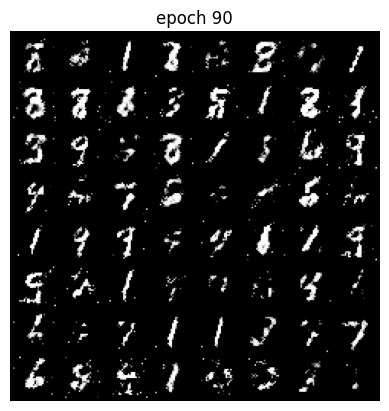

Epoch 90 of 100
Generator loss: 2.03471573, Discriminator loss: 0.77088876


118it [00:16,  7.01it/s]                         


Epoch 91 of 100
Generator loss: 2.03471512, Discriminator loss: 0.76284733


118it [00:16,  7.11it/s]                         


Epoch 92 of 100
Generator loss: 2.12523773, Discriminator loss: 0.72463360


118it [00:16,  7.09it/s]                         


Epoch 93 of 100
Generator loss: 2.01757645, Discriminator loss: 0.77820105


118it [00:17,  6.93it/s]                         


Epoch 94 of 100
Generator loss: 2.10940877, Discriminator loss: 0.75417094


118it [00:16,  6.99it/s]                         


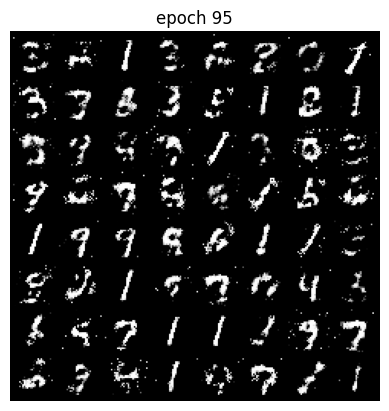

Epoch 95 of 100
Generator loss: 2.03449877, Discriminator loss: 0.76162649


118it [00:16,  7.01it/s]                         


Epoch 96 of 100
Generator loss: 2.08558576, Discriminator loss: 0.73903945


118it [00:16,  7.06it/s]                         


Epoch 97 of 100
Generator loss: 2.02112526, Discriminator loss: 0.78170532


118it [00:16,  7.07it/s]                         


Epoch 98 of 100
Generator loss: 2.00950753, Discriminator loss: 0.76570671


118it [00:16,  7.11it/s]                         


Epoch 99 of 100
Generator loss: 2.07497539, Discriminator loss: 0.74776250


118it [00:16,  7.02it/s]                         


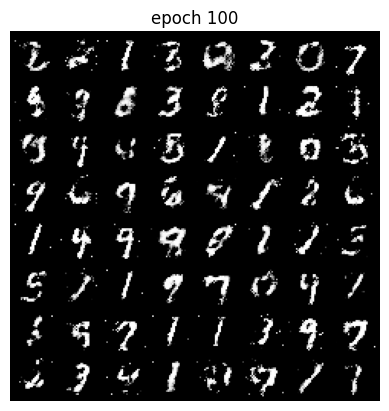

Epoch 100 of 100
Generator loss: 1.94896966, Discriminator loss: 0.79105755


In [53]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)

def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)


for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ##########
        # train the discriminator

        discriminator.zero_grad()

        # Train with real images
        real_images = data[0].to(device)
        batch_size = real_images.size(0)
        real_labels = label_real(batch_size)

        # Compute the discriminator losses on real images
        d_real = discriminator(real_images)
        d_real_loss = discriminator_loss(d_real, real_labels)

        # Train with fake images
        z = create_noise(batch_size, nz)
        fake_images = generator(z)
        fake_labels = label_fake(fake_images.size(0))

        # Compute the discriminator losses on fake images
        d_fake = discriminator(fake_images.detach())
        d_fake_loss = discriminator_loss(d_fake, fake_labels)

        # add up loss and perform backprop
        loss_dis = d_real_loss + d_fake_loss
        loss_dis.backward()
        optim_d.step()

        loss_d += loss_dis.item()

        # train the generator
        generator.zero_grad()

        # Generate fake images
        z = create_noise(batch_size, nz)
        fake_labels = label_real(batch_size)
        fake_images = generator(z)

        # Compute the discriminator losses on fake images using flipped labels
        d_fake = discriminator(fake_images)
        loss_gen = generator_loss(d_fake, fake_labels)

        # perform backprop
        loss_gen.backward()
        optim_g.step()

        loss_g += loss_gen.item()

        ######################################


    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()

    # make the images as grid
    generated_img = make_grid(generated_img)

    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()

    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)

    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [54]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [55]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

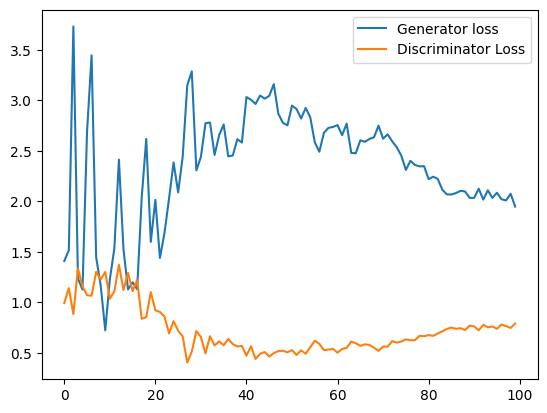

In [57]:
# print(f"Type of loss_g: {type(losses_g[0])}, Type of loss_d: {type(losses_d)}")
# losses_g = [loss_g for loss_g in losses_g]
# losses_d = [loss_d for loss_d in losses_d]

# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')

### **Question 2: Replace the generator update rule**

118it [00:15,  7.69it/s]                         


Epoch 1 of 100
Generator loss: -0.22806660, Discriminator loss: 0.42678619


118it [00:15,  7.77it/s]                         


Epoch 2 of 100
Generator loss: -0.00005033, Discriminator loss: 0.00010901


118it [00:15,  7.85it/s]                         


Epoch 3 of 100
Generator loss: -0.00005599, Discriminator loss: 0.00010041


118it [00:15,  7.55it/s]                         


Epoch 4 of 100
Generator loss: -0.00008017, Discriminator loss: 0.00010011


118it [00:15,  7.64it/s]                         


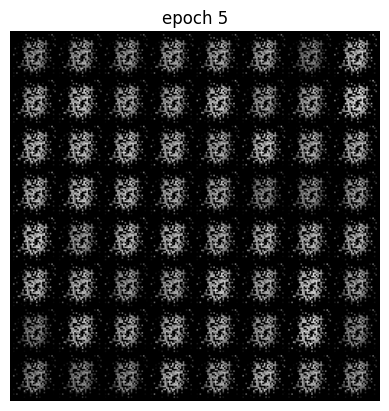

Epoch 5 of 100
Generator loss: -0.00010669, Discriminator loss: 0.00013078


118it [00:15,  7.52it/s]                         


Epoch 6 of 100
Generator loss: -0.00041862, Discriminator loss: 0.00668916


118it [00:15,  7.55it/s]                         


Epoch 7 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:15,  7.58it/s]                         


Epoch 8 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000005


118it [00:15,  7.57it/s]                         


Epoch 9 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000045


118it [00:15,  7.49it/s]                         


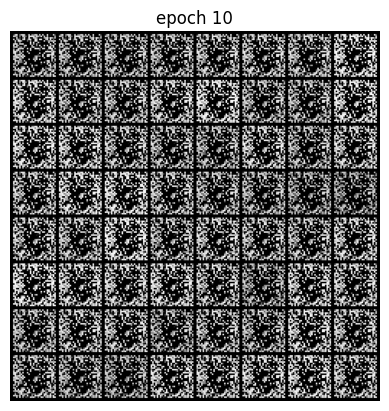

Epoch 10 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000005


118it [00:16,  7.34it/s]                         


Epoch 11 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000024


118it [00:17,  6.92it/s]                         


Epoch 12 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:15,  7.49it/s]                         


Epoch 13 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000027


118it [00:16,  7.35it/s]                         


Epoch 14 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000004


118it [00:15,  7.45it/s]                         


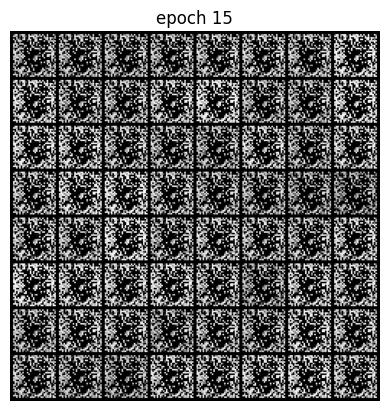

Epoch 15 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:15,  7.59it/s]                         


Epoch 16 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:15,  7.44it/s]                         


Epoch 17 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:15,  7.42it/s]                         


Epoch 18 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:15,  7.59it/s]                         


Epoch 19 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:15,  7.66it/s]                         


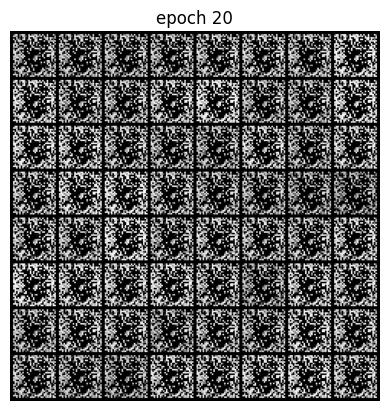

Epoch 20 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:15,  7.42it/s]                         


Epoch 21 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000004


118it [00:16,  7.34it/s]                         


Epoch 22 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:16,  7.33it/s]                         


Epoch 23 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000016


118it [00:15,  7.50it/s]                         


Epoch 24 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.20it/s]                         


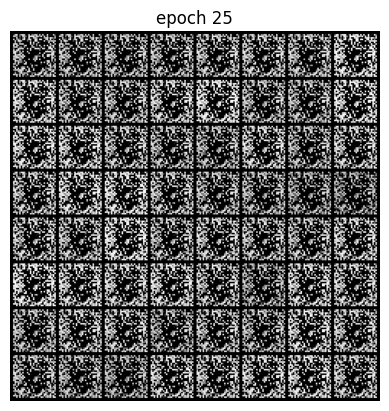

Epoch 25 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:16,  7.33it/s]                         


Epoch 26 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.25it/s]                         


Epoch 27 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000007


118it [00:15,  7.42it/s]                         


Epoch 28 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:16,  7.30it/s]                         


Epoch 29 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.36it/s]                         


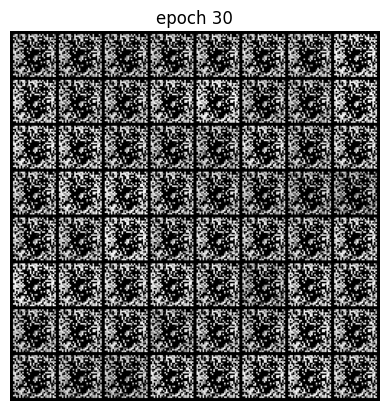

Epoch 30 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.18it/s]                         


Epoch 31 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.11it/s]                         


Epoch 32 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000007


118it [00:16,  7.04it/s]                         


Epoch 33 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.30it/s]                         


Epoch 34 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.34it/s]                         


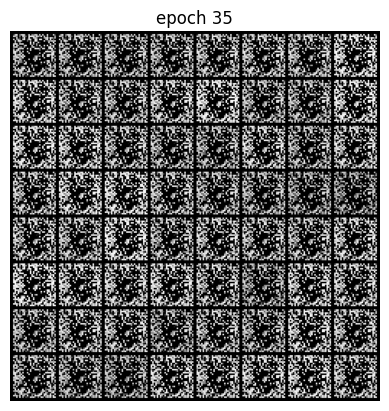

Epoch 35 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.12it/s]                         


Epoch 36 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:16,  7.02it/s]                         


Epoch 37 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.07it/s]                         


Epoch 38 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.06it/s]                         


Epoch 39 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:16,  6.95it/s]                         


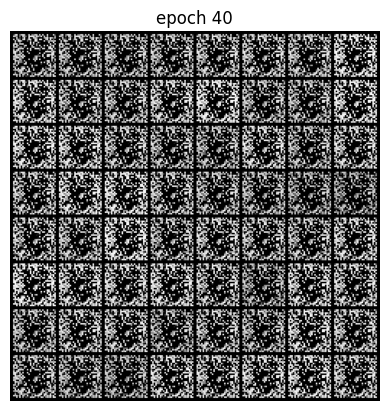

Epoch 40 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:16,  7.01it/s]                         


Epoch 41 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.07it/s]                         


Epoch 42 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.09it/s]                         


Epoch 43 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:18,  6.52it/s]                         


Epoch 44 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.03it/s]                         


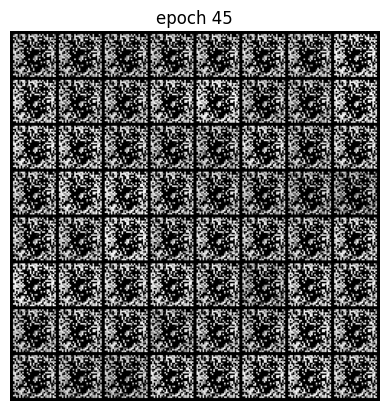

Epoch 45 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000002


118it [00:16,  6.99it/s]                         


Epoch 46 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000003


118it [00:16,  6.98it/s]                         


Epoch 47 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.07it/s]                         


Epoch 48 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.94it/s]                         


Epoch 49 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.87it/s]                         


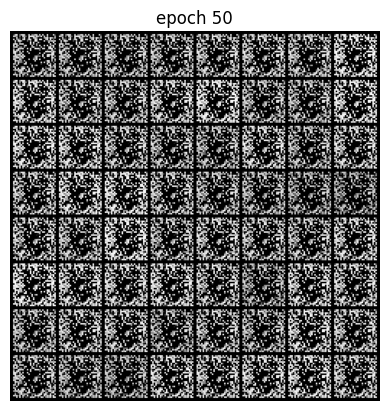

Epoch 50 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.74it/s]                         


Epoch 51 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.83it/s]                         


Epoch 52 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.88it/s]                         


Epoch 53 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:17,  6.86it/s]                         


Epoch 54 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.59it/s]                         


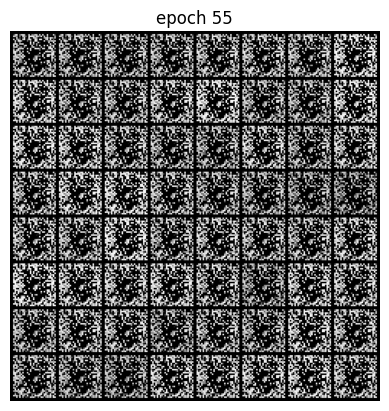

Epoch 55 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.72it/s]                         


Epoch 56 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.93it/s]                         


Epoch 57 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.73it/s]                         


Epoch 58 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:16,  7.01it/s]                         


Epoch 59 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.92it/s]                         


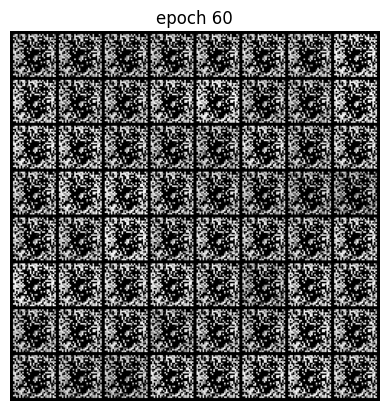

Epoch 60 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:17,  6.82it/s]                         


Epoch 61 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000001


118it [00:16,  6.96it/s]                         


Epoch 62 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000018


118it [00:17,  6.81it/s]                         


Epoch 63 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.79it/s]                         


Epoch 64 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.57it/s]                         


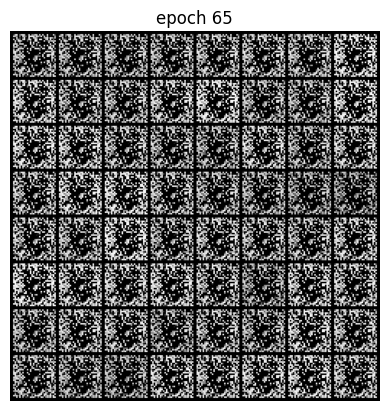

Epoch 65 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.71it/s]                         


Epoch 66 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.62it/s]                         


Epoch 67 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.61it/s]                         


Epoch 68 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.46it/s]                         


Epoch 69 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.60it/s]                         


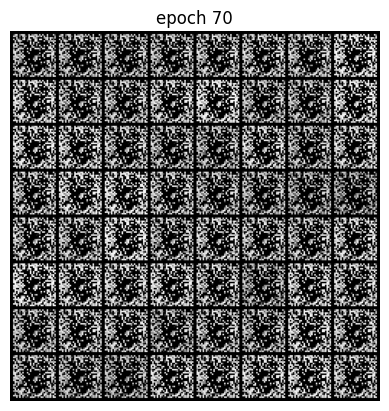

Epoch 70 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.65it/s]                         


Epoch 71 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.50it/s]                         


Epoch 72 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.38it/s]                         


Epoch 73 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:19,  5.96it/s]                         


Epoch 74 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.63it/s]                         


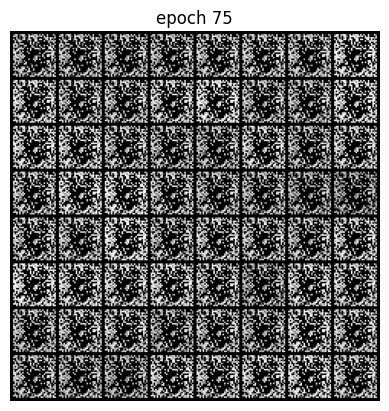

Epoch 75 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.64it/s]                         


Epoch 76 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.66it/s]                         


Epoch 77 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.68it/s]                         


Epoch 78 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.56it/s]                         


Epoch 79 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.39it/s]                         


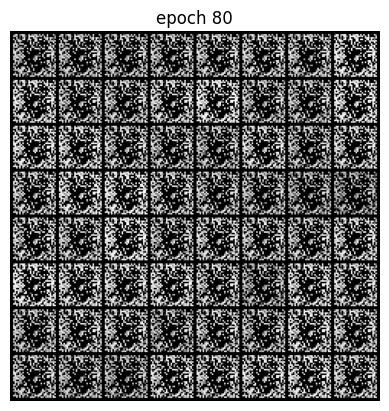

Epoch 80 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.37it/s]                         


Epoch 81 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.41it/s]                         


Epoch 82 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.34it/s]                         


Epoch 83 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.36it/s]                         


Epoch 84 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.38it/s]                         


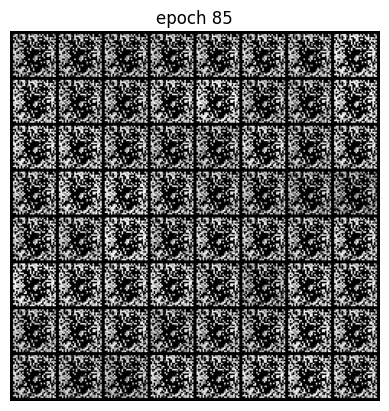

Epoch 85 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.41it/s]                         


Epoch 86 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.54it/s]                         


Epoch 87 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.62it/s]                         


Epoch 88 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.53it/s]                         


Epoch 89 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.51it/s]                         


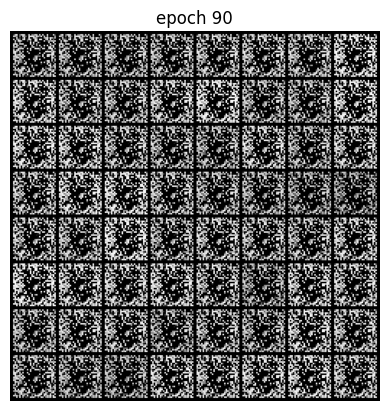

Epoch 90 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:19,  6.19it/s]                         


Epoch 91 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.38it/s]                         


Epoch 92 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.27it/s]                         


Epoch 93 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.35it/s]                         


Epoch 94 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:17,  6.58it/s]                         


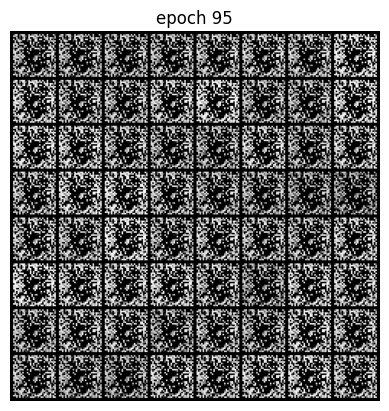

Epoch 95 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:19,  6.17it/s]                         


Epoch 96 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.32it/s]                         


Epoch 97 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.30it/s]                         


Epoch 98 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.41it/s]                         


Epoch 99 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:18,  6.37it/s]                         


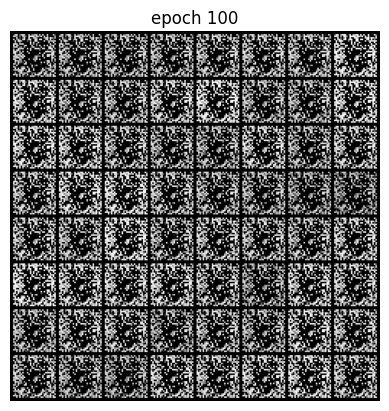

Epoch 100 of 100
Generator loss: -0.00000000, Discriminator loss: 0.00000000


In [124]:
def generator_loss(output, true_label):
    return torch.log(true_label - output).mean()

def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)

for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ##########
        # train the discriminator

        discriminator.zero_grad()

        # Train with real images
        real_images = data[0].to(device)
        batch_size = real_images.size(0)
        real_labels = label_real(batch_size)

        # Compute the discriminator losses on real images
        d_real = discriminator(real_images)
        d_real_loss = discriminator_loss(d_real, real_labels)

        # Train with fake images
        z = create_noise(batch_size, nz)
        fake_images = generator(z)
        fake_labels = label_fake(fake_images.size(0))

        # Compute the discriminator losses on fake images
        d_fake = discriminator(fake_images.detach())
        d_fake_loss = discriminator_loss(d_fake, fake_labels)

        # add up loss and perform backprop
        loss_dis = d_real_loss + d_fake_loss
        loss_dis.backward()
        optim_d.step()

        loss_d += loss_dis.item()

        # train the generator
        generator.zero_grad()

        # Generate fake images
        z = create_noise(batch_size, nz)
        fake_labels = label_real(batch_size)
        fake_images = generator(z)

        # Compute the discriminator losses on fake images using flipped labels
        d_fake = discriminator(fake_images)
        loss_gen = generator_loss(d_fake, fake_labels)

        # perform backprop
        loss_gen.backward()
        optim_g.step()

        loss_g += loss_gen.item()

        ######################################


    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()

    # make the images as grid
    generated_img = make_grid(generated_img)

    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()

    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs2/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)

    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [125]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs2/generator.pth')

DONE TRAINING


In [126]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs2/generator_images.gif', imgs)

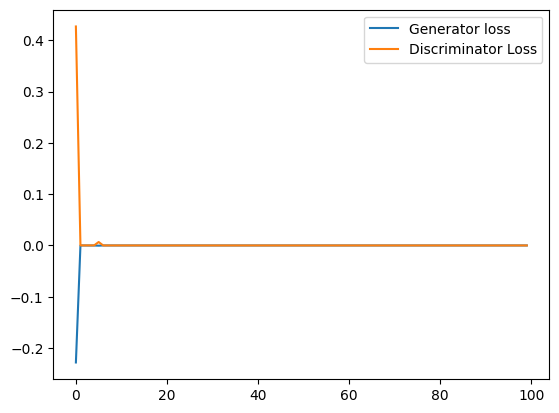

In [127]:
# losses_g = [loss_g.cpu().detach().numpy() for loss_g in losses_g]
# losses_d = [loss_d.cpu().detach().numpy() for loss_d in losses_d]

# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs2/loss.png')

### **Question 3: Improve GAN training**

In [11]:
# Modify optimizer to use different learning rates
optim_g = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [14]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)*0.9
    return data.to(device)

# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

118it [00:17,  6.57it/s]                         


Epoch 1 of 100
Generator loss: 0.86800296, Discriminator loss: 1.21134653


118it [00:15,  7.56it/s]                         


Epoch 2 of 100
Generator loss: 1.50864482, Discriminator loss: 0.96436303


118it [00:15,  7.75it/s]                         


Epoch 3 of 100
Generator loss: 2.67016307, Discriminator loss: 0.83023582


118it [00:15,  7.66it/s]                         


Epoch 4 of 100
Generator loss: 3.51540719, Discriminator loss: 0.69087309


118it [00:15,  7.77it/s]                         


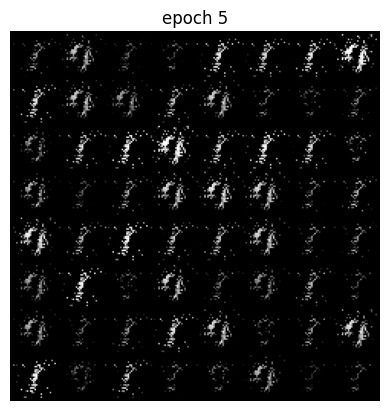

Epoch 5 of 100
Generator loss: 3.79361376, Discriminator loss: 0.66193274


118it [00:15,  7.61it/s]                         


Epoch 6 of 100
Generator loss: 3.36206261, Discriminator loss: 0.71105433


118it [00:15,  7.63it/s]                         


Epoch 7 of 100
Generator loss: 3.71554161, Discriminator loss: 0.65442644


118it [00:16,  7.27it/s]                         


Epoch 8 of 100
Generator loss: 3.72126359, Discriminator loss: 0.60815537


118it [00:15,  7.73it/s]                         


Epoch 9 of 100
Generator loss: 3.27353146, Discriminator loss: 0.71616647


118it [00:15,  7.62it/s]                         


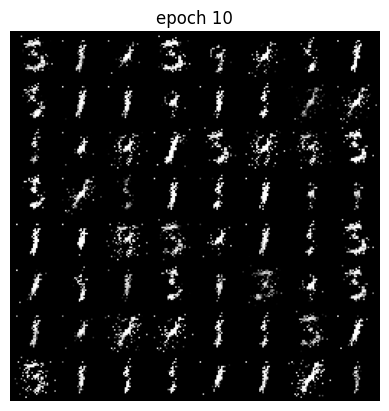

Epoch 10 of 100
Generator loss: 3.24460788, Discriminator loss: 0.68875754


118it [00:16,  7.36it/s]                         


Epoch 11 of 100
Generator loss: 3.01720163, Discriminator loss: 0.69669135


118it [00:15,  7.55it/s]                         


Epoch 12 of 100
Generator loss: 3.37169885, Discriminator loss: 0.68780288


118it [00:15,  7.54it/s]                         


Epoch 13 of 100
Generator loss: 3.27286818, Discriminator loss: 0.67715454


118it [00:15,  7.51it/s]                         


Epoch 14 of 100
Generator loss: 2.95323609, Discriminator loss: 0.69404619


118it [00:15,  7.53it/s]                         


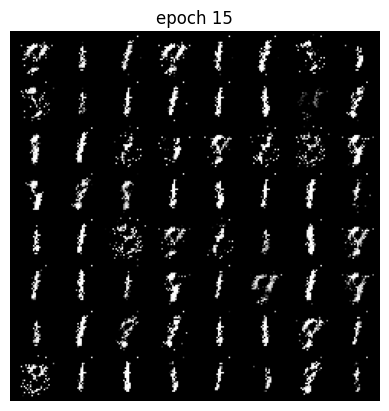

Epoch 15 of 100
Generator loss: 2.76172725, Discriminator loss: 0.68933163


118it [00:15,  7.38it/s]                         


Epoch 16 of 100
Generator loss: 2.72682818, Discriminator loss: 0.69127332


118it [00:15,  7.38it/s]                         


Epoch 17 of 100
Generator loss: 2.73927256, Discriminator loss: 0.66144033


118it [00:16,  7.22it/s]                         


Epoch 18 of 100
Generator loss: 2.65985463, Discriminator loss: 0.69741888


118it [00:15,  7.39it/s]                         


Epoch 19 of 100
Generator loss: 2.57723409, Discriminator loss: 0.72245940


118it [00:15,  7.40it/s]                         


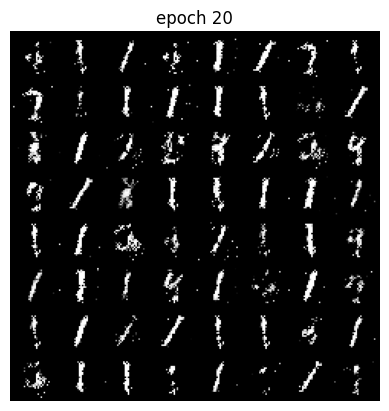

Epoch 20 of 100
Generator loss: 2.46511708, Discriminator loss: 0.73829502


118it [00:15,  7.48it/s]                         


Epoch 21 of 100
Generator loss: 2.39437345, Discriminator loss: 0.73780711


118it [00:15,  7.55it/s]                         


Epoch 22 of 100
Generator loss: 2.23458550, Discriminator loss: 0.82840489


118it [00:15,  7.59it/s]                         


Epoch 23 of 100
Generator loss: 2.21923803, Discriminator loss: 0.84337201


118it [00:15,  7.55it/s]                         


Epoch 24 of 100
Generator loss: 2.12593819, Discriminator loss: 0.85454855


118it [00:15,  7.62it/s]                         


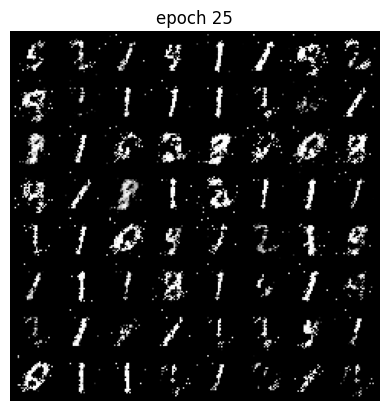

Epoch 25 of 100
Generator loss: 2.12310619, Discriminator loss: 0.84916315


118it [00:15,  7.56it/s]                         


Epoch 26 of 100
Generator loss: 2.08217386, Discriminator loss: 0.83574175


118it [00:15,  7.57it/s]                         


Epoch 27 of 100
Generator loss: 2.10536099, Discriminator loss: 0.85724080


118it [00:15,  7.57it/s]                         


Epoch 28 of 100
Generator loss: 1.97916343, Discriminator loss: 0.90130654


118it [00:15,  7.55it/s]                         


Epoch 29 of 100
Generator loss: 2.00749565, Discriminator loss: 0.88423400


118it [00:15,  7.50it/s]                         


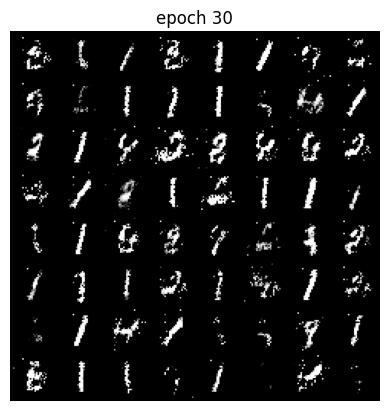

Epoch 30 of 100
Generator loss: 1.93421475, Discriminator loss: 0.90103299


118it [00:15,  7.49it/s]                         


Epoch 31 of 100
Generator loss: 1.90043480, Discriminator loss: 0.89680785


118it [00:16,  7.29it/s]                         


Epoch 32 of 100
Generator loss: 1.94592211, Discriminator loss: 0.88641208


118it [00:15,  7.52it/s]                         


Epoch 33 of 100
Generator loss: 1.87071759, Discriminator loss: 0.91687732


118it [00:15,  7.63it/s]                         


Epoch 34 of 100
Generator loss: 1.86869878, Discriminator loss: 0.91452618


118it [00:15,  7.51it/s]                         


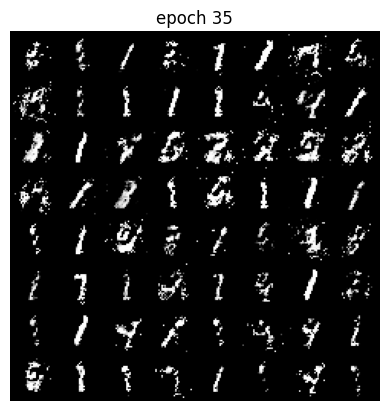

Epoch 35 of 100
Generator loss: 1.89860960, Discriminator loss: 0.90281656


118it [00:15,  7.51it/s]                         


Epoch 36 of 100
Generator loss: 1.84450748, Discriminator loss: 0.92451726


118it [00:15,  7.46it/s]                         


Epoch 37 of 100
Generator loss: 1.83215996, Discriminator loss: 0.92215622


118it [00:15,  7.47it/s]                         


Epoch 38 of 100
Generator loss: 1.80346849, Discriminator loss: 0.95315083


118it [00:15,  7.46it/s]                         


Epoch 39 of 100
Generator loss: 1.82072491, Discriminator loss: 0.93925598


118it [00:15,  7.53it/s]                         


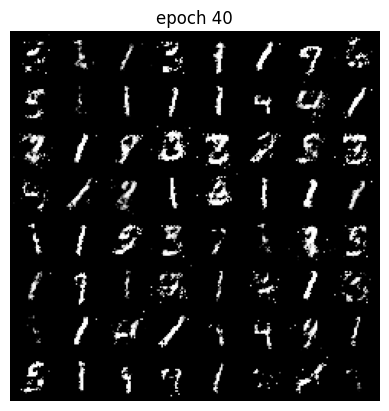

Epoch 40 of 100
Generator loss: 1.74512987, Discriminator loss: 0.96690432


118it [00:15,  7.44it/s]                         


Epoch 41 of 100
Generator loss: 1.73659875, Discriminator loss: 0.96908671


118it [00:15,  7.40it/s]                         


Epoch 42 of 100
Generator loss: 1.72232294, Discriminator loss: 0.96172948


118it [00:15,  7.54it/s]                         


Epoch 43 of 100
Generator loss: 1.62045281, Discriminator loss: 1.00887250


118it [00:15,  7.54it/s]                         


Epoch 44 of 100
Generator loss: 1.62940222, Discriminator loss: 1.00633074


118it [00:15,  7.52it/s]                         


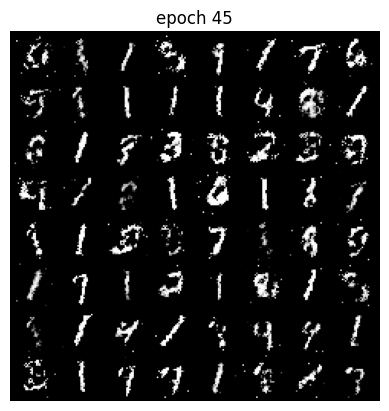

Epoch 45 of 100
Generator loss: 1.61950378, Discriminator loss: 1.00905061


118it [00:15,  7.42it/s]                         


Epoch 46 of 100
Generator loss: 1.60617863, Discriminator loss: 1.00927160


118it [00:15,  7.42it/s]                         


Epoch 47 of 100
Generator loss: 1.61818786, Discriminator loss: 1.01693765


118it [00:15,  7.41it/s]                         


Epoch 48 of 100
Generator loss: 1.58202218, Discriminator loss: 1.02757215


118it [00:15,  7.47it/s]                         


Epoch 49 of 100
Generator loss: 1.58658603, Discriminator loss: 1.02779371


118it [00:15,  7.41it/s]                         


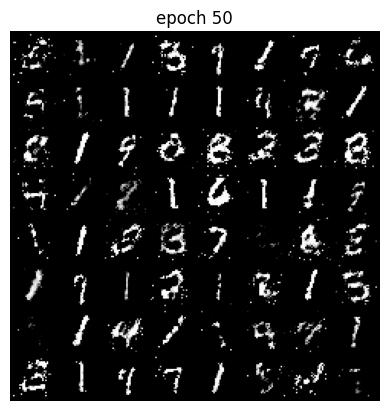

Epoch 50 of 100
Generator loss: 1.54733269, Discriminator loss: 1.02811407


118it [00:16,  7.36it/s]                         


Epoch 51 of 100
Generator loss: 1.54276527, Discriminator loss: 1.03102010


118it [00:16,  7.36it/s]                         


Epoch 52 of 100
Generator loss: 1.54827346, Discriminator loss: 1.04315363


118it [00:16,  7.33it/s]                         


Epoch 53 of 100
Generator loss: 1.49507969, Discriminator loss: 1.05230335


118it [00:16,  7.36it/s]                         


Epoch 54 of 100
Generator loss: 1.52467416, Discriminator loss: 1.04035799


118it [00:15,  7.45it/s]                         


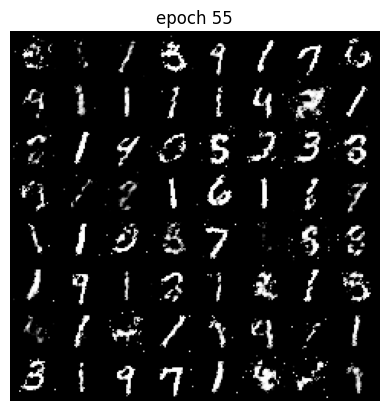

Epoch 55 of 100
Generator loss: 1.52274818, Discriminator loss: 1.03923848


118it [00:16,  7.31it/s]                         


Epoch 56 of 100
Generator loss: 1.49098237, Discriminator loss: 1.04937619


118it [00:16,  7.37it/s]                         


Epoch 57 of 100
Generator loss: 1.47723498, Discriminator loss: 1.06558535


118it [00:15,  7.42it/s]                         


Epoch 58 of 100
Generator loss: 1.47302850, Discriminator loss: 1.06181857


118it [00:16,  7.28it/s]                         


Epoch 59 of 100
Generator loss: 1.46849577, Discriminator loss: 1.05795435


118it [00:16,  7.29it/s]                         


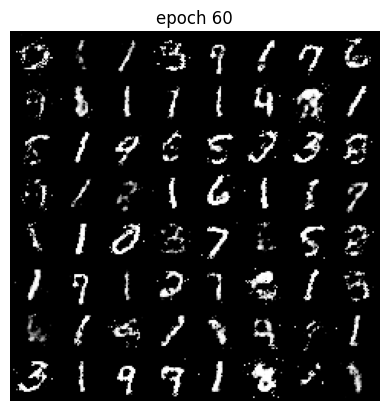

Epoch 60 of 100
Generator loss: 1.48795620, Discriminator loss: 1.05656952


118it [00:16,  7.36it/s]                         


Epoch 61 of 100
Generator loss: 1.43469082, Discriminator loss: 1.08184042


118it [00:15,  7.47it/s]                         


Epoch 62 of 100
Generator loss: 1.42754974, Discriminator loss: 1.07930499


118it [00:16,  7.30it/s]                         


Epoch 63 of 100
Generator loss: 1.46926311, Discriminator loss: 1.06028147


118it [00:16,  7.36it/s]                         


Epoch 64 of 100
Generator loss: 1.43280809, Discriminator loss: 1.07474145


118it [00:16,  7.27it/s]                         


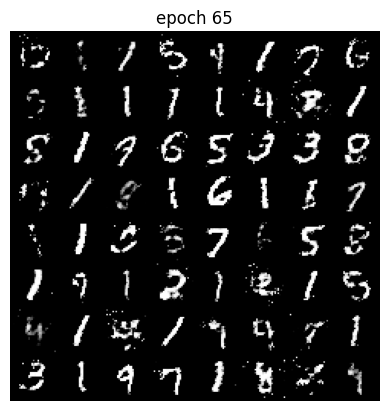

Epoch 65 of 100
Generator loss: 1.41910686, Discriminator loss: 1.07588390


118it [00:16,  7.29it/s]                         


Epoch 66 of 100
Generator loss: 1.44159697, Discriminator loss: 1.07381922


118it [00:16,  7.27it/s]                         


Epoch 67 of 100
Generator loss: 1.42105850, Discriminator loss: 1.07724944


118it [00:16,  7.36it/s]                         


Epoch 68 of 100
Generator loss: 1.38834802, Discriminator loss: 1.09107819


118it [00:15,  7.39it/s]                         


Epoch 69 of 100
Generator loss: 1.42070944, Discriminator loss: 1.07643644


118it [00:16,  7.35it/s]                         


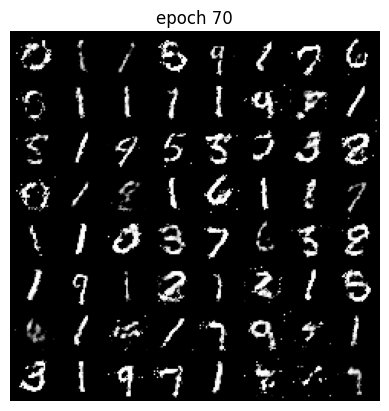

Epoch 70 of 100
Generator loss: 1.42468894, Discriminator loss: 1.07645271


118it [00:16,  7.28it/s]                         


Epoch 71 of 100
Generator loss: 1.42572784, Discriminator loss: 1.06743485


118it [00:15,  7.43it/s]                         


Epoch 72 of 100
Generator loss: 1.41681262, Discriminator loss: 1.08195342


118it [00:16,  7.28it/s]                         


Epoch 73 of 100
Generator loss: 1.41795162, Discriminator loss: 1.07812135


118it [00:16,  7.37it/s]                         


Epoch 74 of 100
Generator loss: 1.41175649, Discriminator loss: 1.07997041


118it [00:15,  7.38it/s]                         


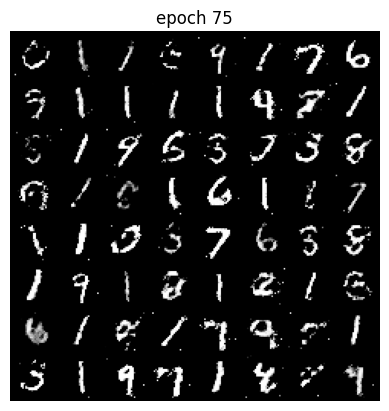

Epoch 75 of 100
Generator loss: 1.41357163, Discriminator loss: 1.08649156


118it [00:16,  7.17it/s]                         


Epoch 76 of 100
Generator loss: 1.41049307, Discriminator loss: 1.08629894


118it [00:16,  7.34it/s]                         


Epoch 77 of 100
Generator loss: 1.39076827, Discriminator loss: 1.08881858


118it [00:16,  7.35it/s]                         


Epoch 78 of 100
Generator loss: 1.41404991, Discriminator loss: 1.08457383


118it [00:16,  7.15it/s]                         


Epoch 79 of 100
Generator loss: 1.37710282, Discriminator loss: 1.09284437


118it [00:16,  7.22it/s]                         


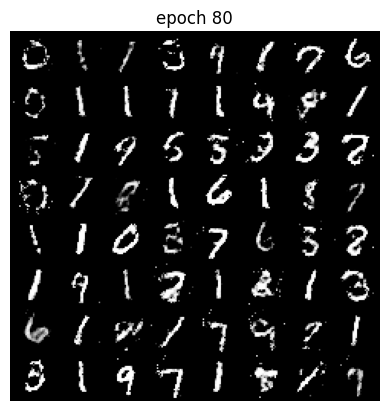

Epoch 80 of 100
Generator loss: 1.39085140, Discriminator loss: 1.08441219


118it [00:16,  7.17it/s]                         


Epoch 81 of 100
Generator loss: 1.40455318, Discriminator loss: 1.08467385


118it [00:16,  7.22it/s]                         


Epoch 82 of 100
Generator loss: 1.39669919, Discriminator loss: 1.09019862


118it [00:16,  7.27it/s]                         


Epoch 83 of 100
Generator loss: 1.39816304, Discriminator loss: 1.08680348


118it [00:16,  7.26it/s]                         


Epoch 84 of 100
Generator loss: 1.39266381, Discriminator loss: 1.08851817


118it [00:16,  7.30it/s]                         


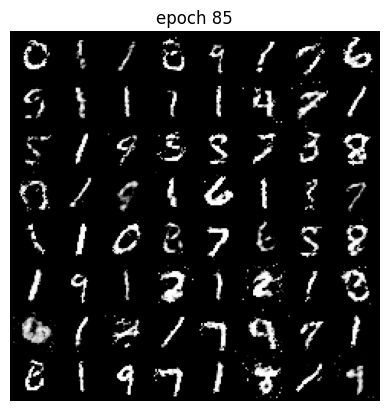

Epoch 85 of 100
Generator loss: 1.37774424, Discriminator loss: 1.08847631


118it [00:16,  7.35it/s]                         


Epoch 86 of 100
Generator loss: 1.38566824, Discriminator loss: 1.09778903


118it [00:16,  7.23it/s]                         


Epoch 87 of 100
Generator loss: 1.37261308, Discriminator loss: 1.09353517


118it [00:16,  7.23it/s]                         


Epoch 88 of 100
Generator loss: 1.38371835, Discriminator loss: 1.09203227


118it [00:16,  7.29it/s]                         


Epoch 89 of 100
Generator loss: 1.37080736, Discriminator loss: 1.09844214


118it [00:16,  7.27it/s]                         


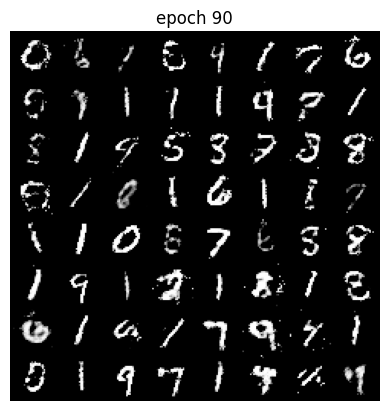

Epoch 90 of 100
Generator loss: 1.36232764, Discriminator loss: 1.10308060


118it [00:16,  7.23it/s]                         


Epoch 91 of 100
Generator loss: 1.38212967, Discriminator loss: 1.09756778


118it [00:22,  5.36it/s]                         


Epoch 92 of 100
Generator loss: 1.36933292, Discriminator loss: 1.10164279


118it [00:15,  7.48it/s]                         


Epoch 93 of 100
Generator loss: 1.35428147, Discriminator loss: 1.10737738


118it [00:16,  6.95it/s]                         


Epoch 94 of 100
Generator loss: 1.36142466, Discriminator loss: 1.10248551


118it [00:15,  7.38it/s]                         


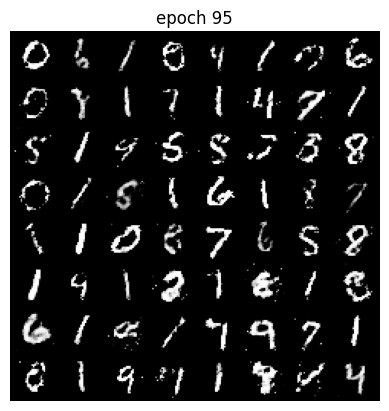

Epoch 95 of 100
Generator loss: 1.36338083, Discriminator loss: 1.10217891


118it [00:17,  6.88it/s]                         


Epoch 96 of 100
Generator loss: 1.36531640, Discriminator loss: 1.10441500


118it [00:16,  7.26it/s]                         


Epoch 97 of 100
Generator loss: 1.35343820, Discriminator loss: 1.09850170


118it [00:16,  7.08it/s]                         


Epoch 98 of 100
Generator loss: 1.37721620, Discriminator loss: 1.09249700


118it [00:16,  7.26it/s]                         


Epoch 99 of 100
Generator loss: 1.36348729, Discriminator loss: 1.10006170


118it [00:16,  7.13it/s]                         


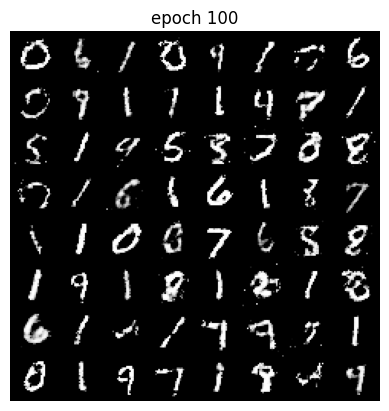

Epoch 100 of 100
Generator loss: 1.36181846, Discriminator loss: 1.10260263


In [18]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)

def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    return criterion(output, true_label)


for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ##########
        # train the discriminator

        discriminator.zero_grad()

        # Train with real images
        real_images = data[0].to(device)
        batch_size = real_images.size(0)
        real_labels = label_real(batch_size)

        # Compute the discriminator losses on real images
        d_real = discriminator(real_images)
        d_real_loss = discriminator_loss(d_real, real_labels)

        # Train with fake images
        z = create_noise(batch_size, nz)
        fake_images = generator(z)
        fake_labels = label_fake(fake_images.size(0))

        # Compute the discriminator losses on fake images
        d_fake = discriminator(fake_images.detach())
        d_fake_loss = discriminator_loss(d_fake, fake_labels)

        # add up loss and perform backprop
        loss_dis = d_real_loss + d_fake_loss
        loss_dis.backward()
        optim_d.step()

        loss_d += loss_dis.item()

        # train the generator
        generator.zero_grad()

        # Generate fake images
        z = create_noise(batch_size, nz)
        fake_labels = label_real(batch_size)
        fake_images = generator(z)

        # Compute the discriminator losses on fake images using flipped labels
        d_fake = discriminator(fake_images)
        loss_gen = generator_loss(d_fake, fake_labels)

        # perform backprop
        loss_gen.backward()
        optim_g.step()

        loss_g += loss_gen.item()

        ######################################


    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()

    # make the images as grid
    generated_img = make_grid(generated_img)

    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()

    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs3/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)

    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [19]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs3/generator.pth')

DONE TRAINING


In [20]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs3/generator_images.gif', imgs)

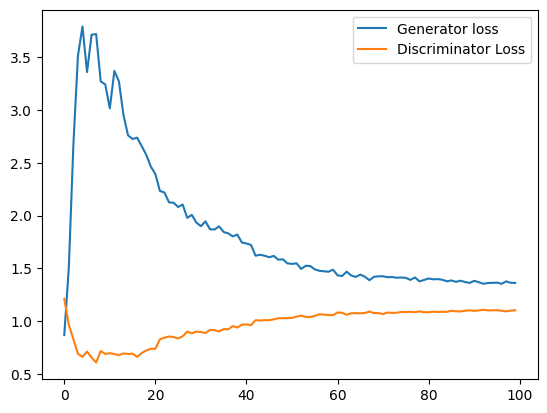

In [21]:
# losses_g = [loss_g.cpu().detach().numpy() for loss_g in losses_g]
# losses_d = [loss_d.cpu().detach().numpy() for loss_d in losses_d]

# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs3/loss.png')